# Seasonality

### Data Separation 

In [ ]:
import os
import pandas as pd
from pathlib import Path

# Verzeichnisse festlegen
input_verzeichnis = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/1_abfluss"
output_verzeichnis_sommer = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_sommer"
output_verzeichnis_winter = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter"

# Stelle sicher, dass die Ausgabeverzeichnisse existieren
os.makedirs(output_verzeichnis_sommer, exist_ok=True)
os.makedirs(output_verzeichnis_winter, exist_ok=True)

# Alle Excel-Dateien im Eingabeverzeichnis finden
input_files = Path(input_verzeichnis).glob("*.xlsx")

# Durch jede Datei iterieren
for file_path in input_files:
    # Excel-Datei laden
    df = pd.read_excel(file_path)

    # Stelle sicher, dass das Datum als Datetime-Objekt erkannt wird
    df['datum'] = pd.to_datetime(df['datum'], errors='coerce')

    # Filtere die Daten für Sommer (Mai-Oktober)
    df_sommer = df[df['datum'].dt.month.isin([5, 6, 7, 8, 9, 10])]

    # Filtere die Daten für Winter (November-April)
    df_winter = df[df['datum'].dt.month.isin([11, 12, 1, 2, 3, 4])]

    # Dateiname für die Ausgabedateien erstellen
    filename = file_path.stem
    sommer_file_path = os.path.join(output_verzeichnis_sommer, f"{filename}_sommer.xlsx")
    winter_file_path = os.path.join(output_verzeichnis_winter, f"{filename}_winter.xlsx")

    # Gefilterte Daten in neue Excel-Dateien speichern
    df_sommer.to_excel(sommer_file_path, index=False)
    df_winter.to_excel(winter_file_path, index=False)

print("Daten wurden erfolgreich nach Sommer und Winter getrennt und gespeichert.")

#### Format Date

In [ ]:
import os
import pandas as pd

# Verzeichnis mit den Excel-Dateien
#input_directory = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_sommer"
input_directory = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter"


# Liste der Dateien im Eingabeverzeichnis
file_list = os.listdir(input_directory)

# Schleife über jede Excel-Datei
for file_name in file_list:
    if file_name.endswith('.xlsx'):
        # Vollständiger Pfad zur aktuellen Excel-Datei
        input_file_path = os.path.join(input_directory, file_name)
        
        # Einlesen der Excel-Datei
        df = pd.read_excel(input_file_path)
        
        # Ändern des Datumsformats
        df['datum'] = pd.to_datetime(df['datum']).dt.strftime('%d.%m.%Y')
        
        # Speichern der bearbeiteten Excel-Datei (Überschreiben der Originaldatei)
        df.to_excel(input_file_path, index=False)

print("Vorgang abgeschlossen.")

## DFI-Calculation 

In [2]:
# Laden der benötigten Pakete
library(readxl)
library(delayedflow)
library(openxlsx)

# Verzeichnis
#input_verzeichnis <- "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_sommer"
input_verzeichnis <- "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter"


#output_verzeichnis <- "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_sommer"
output_verzeichnis <- "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_winter"

# Liste Input
alle_dateien <- list.files(path = input_verzeichnis, pattern = "\\.xlsx$", full.names = TRUE)

# Schleife durch alle Dateien
for (datei in alle_dateien) {
  
  if (!grepl("~$", basename(datei)) & file.info(datei)$size > 0) {
    print(paste("Verarbeite Datei:", datei))  # Debug-Ausgabe
    
    # Datei einlesen try
    tryCatch({
      # Datei einlesen
      excel_data <- read_excel(datei)
      
      # DFI Berechnung
      dfi_berechnung <- dfi_n(excel_data$abfluss_norm_lskm2, n = 1:180)
      
      # Basisnamen aus Dateinamen extrahieren
      basis_name <- gsub("abfluss_", "", tools::file_path_sans_ext(basename(datei)))
      
      # Dateinamen Ausgabedatei
      output_datei_name <- paste0("dfi_", basis_name, ".xlsx")
      
      # Pfad Ausgabedatei
      output_pfad <- file.path(output_verzeichnis, output_datei_name)
      
      # Speichern der bearbeiteten Spalte als separate Excel-Datei
      write.xlsx(data.frame(dfi_berechnung), output_pfad, rowNames = FALSE)
      
      print(paste("Bearbeitete Datei gespeichert unter:", output_pfad))  # Debug
    }, error = function(e) {
      print(paste("Fehler beim Lesen der Datei:", datei))  # Debug
      print(e)  # Debug
    })
  }
}

[1] "Verarbeite Datei: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter/abfluss_abentheuer_winter.xlsx"
[1] "Bearbeitete Datei gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_winter/dfi_abentheuer_winter.xlsx"
[1] "Verarbeite Datei: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter/abfluss_albisheim_winter.xlsx"
[1] "Bearbeitete Datei gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_winter/dfi_albisheim_winter.xlsx"
[1] "Verarbeite Datei: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/6_saisonalitaet_klimawandel/abfluss_winter_sommer_ohne_dekaden/abfluss_winter/abfluss_alsdorf_oberecken_winter.xlsx"
[1] "Bearbeitete Datei gespeichert unter: C:/Users/Lenovo/Docume

#### DFI Join nach Sommer/Winter

In [ ]:
import os
import pandas as pd

# Verzeichnisse definieren
input_verzeichnis = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_winter"
output_verzeichnis = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden"

#input_verzeichnis = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_sommer"
#output_verzeichnis = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden"

# Liste aller Dateien im Eingabeverzeichnis
alle_dateien = [os.path.join(input_verzeichnis, datei) for datei in os.listdir(input_verzeichnis) if datei.endswith('.xlsx')]

# DataFrame erstellen, um Daten aus allen Dateien zu kombinieren
alle_daten = pd.DataFrame()

# Schleife durch alle Dateien
for datei in alle_dateien:
    try:
        # Datei einlesen
        df = pd.read_excel(datei)
        
        # Spalten umbenennen, um den Dateinamen ohne Präfix zu speichern
        dateiname = os.path.splitext(os.path.basename(datei))[0].replace("dfi_", "").replace("_winter", "")
        #dateiname = os.path.splitext(os.path.basename(datei))[0].replace("dfi_", "").replace("_sommer", "")
        spalten = {spalte: dateiname if spalte != "n" else spalte for spalte in df.columns}
        df = df.rename(columns=spalten)
        
        # Daten zum kombinierten DataFrame hinzufügen
        if alle_daten.empty:
            alle_daten = df
        else:
            alle_daten = pd.merge(alle_daten, df, on='n', how='outer')
    except Exception as e:
        print(f"Fehler beim Verarbeiten der Datei {datei}: {e}")

# Ergebnis in eine Excel-Datei schreiben
ausgabedatei = os.path.join(output_verzeichnis, "dfi_join_winter.xlsx")
# ausgabedatei = os.path.join(output_verzeichnis, "dfi_join_sommer.xlsx")
try:
    alle_daten.to_excel(ausgabedatei, index=False)
    print(f"Die kombinierten Daten wurden erfolgreich unter {ausgabedatei} gespeichert.")
except Exception as e:
    print(f"Fehler beim Speichern der kombinierten Daten: {e}")


#### Transpose

In [ ]:
import pandas as pd

# Pfad zur kombinierten Datei
input_datei = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_join_winter.xlsx"
output_datei = "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_transposed_winter.xlsx"

# Kombinierte Datei einlesen
alle_daten = pd.read_excel(input_datei)

# DataFrame zur Speicherung der transponierten Daten
df_transposed = pd.DataFrame(columns=['messstelle'] + list(range(1, len(alle_daten) + 1)))

# Daten transponieren
for col in alle_daten.columns:
    if col != 'n':
        temp_df = alle_daten[['n', col]].set_index('n').transpose()
        temp_df['messstelle'] = col
        df_transposed = pd.concat([df_transposed, temp_df], ignore_index=True)

# Sortieren der Spalten
df_transposed = df_transposed[['messstelle'] + list(range(1, len(alle_daten) + 1))]

# Speichern der transponierten Daten
df_transposed.to_excel(output_datei, index=False)

print(f"Die transponierten Daten wurden erfolgreich in {output_datei} gespeichert.")


#### BPS Calculation

In [ ]:
# Laden der notwendigen Pakete
library(readxl)
library(delayedflow)
library(openxlsx)
library(dplyr)

setwd("C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/dfi_winter")

# Verzeichnis der DFI-Dateien
dfi_files <- list.files(pattern = "dfi_.*\\.xlsx")

# Ergebnisliste initialisieren
results_list <- list()

# Funktion zur Berechnung der Breakpoints und Speicherung der Ergebnisse
process_file <- function(file) {
  # Datei einlesen
  dfi_data <- read_excel(file)
  
  # Sicherstellen, dass die DFI-Spalte vorhanden ist
  if (!"dfi" %in% colnames(dfi_data)) {
    cat("Die Spalte 'dfi' ist in der Datei", file, "nicht vorhanden.\n")
    return(NULL)
  }
  
  # Berechnung der Breakpoints
  bps <- find_bps(dfi_data$dfi, n_bp = 2)
  
  # Extrahieren der Breakpoints und relativen Beiträge
  bp1 <- bps$bps_position["bp_1"]
  bp2 <- bps$bps_position["bp_2"]
  contr1 <- bps$rel_contr["contr_1"]
  contr2 <- bps$rel_contr["contr_2"]
  contr3 <- bps$rel_contr["contr_3"]
  bias <- bps$bias
  
  # Ergebnis speichern
  result <- data.frame(
    file = file,
    bp1 = bp1,
    bp2 = bp2,
    contr1 = contr1,
    contr2 = contr2,
    contr3 = contr3,
    bias = bias
  )
  
  return(result)
}

# Alle Dateien im Verzeichnis verarbeiten
for (file in dfi_files) {
  cat("Verarbeite Datei:", file, "\n")
  result <- process_file(file)
  if (!is.null(result)) {
    results_list <- append(results_list, list(result))
  }
}

# Ergebnisse zusammenführen und speichern
results_df <- bind_rows(results_list)
write.xlsx(results_df, "C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality_ohne_dekaden/breakpoints_results_winter.xlsx")
cat("Ergebnisse wurden in 'breakpoints_results_winter.xlsx' gespeichert.\n")


#### Merge DFI with BP

In [ ]:
import pandas as pd

# Pfade zu den Excel-Dateien
dfi_file = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_transposed_winter.xlsx'
breakpoints_file = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/breakpoints_results_winter_updated.xlsx'

# Laden der Excel-Dateien
dfi_data = pd.read_excel(dfi_file)
breakpoints_data = pd.read_excel(breakpoints_file)

# Mergen der Daten basierend auf den gemeinsamen Spalten 'messstelle' und 'dekade'
merged_data = pd.merge(dfi_data, breakpoints_data, on=['messstelle'], how='inner')

# Speichern der zusammengeführten Daten in eine neue Excel-Datei
merged_data.to_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_winter_merged.xlsx', index=False)

print("Die Dateien wurden erfolgreich zusammengeführt und gespeichert.")

### Cluster Zugehörigkeit hinzufügen


In [ ]:
import pandas as pd

# Load the overview file to extract necessary columns
overview_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/merged_hierarchie_overview_updated.xlsx'
overview_df = pd.read_excel(overview_path)

# Select the desired columns from the overview DataFrame
selected_columns = ['ezg_fluss_1', 'ezg_name', 'messstelle', 'ezg_id', 'area', 'cluster']
overview_df_selected = overview_df[selected_columns]

# Load the summer and winter breakpoints files
summer_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_sommer_merged.xlsx'
winter_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_winter_merged.xlsx'

df_sommer = pd.read_excel(summer_path)
df_winter = pd.read_excel(winter_path)

# Merge the overview data with the summer and winter data on the 'messstelle' column
df_sommer_merged = pd.merge(df_sommer, overview_df_selected, on='messstelle', how='left')
df_winter_merged = pd.merge(df_winter, overview_df_selected, on='messstelle', how='left')

# Save the updated DataFrames to new Excel files
df_sommer_merged.to_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_sommer_merged_updated.xlsx', index=False)
df_winter_merged.to_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_winter_merged_updated.xlsx', index=False)

# Display the head of the merged DataFrames
print(df_sommer_merged.head())
print(df_winter_merged.head())


In [117]:
import pandas as pd
import numpy as np

# Load the combined file
file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_breakpoints_winter_merged_updated.xlsx'
data = pd.read_excel(file_path)

# Function to calculate sections and DFI60 (baseline)
def calculate_sections_and_baseline(row):
    dfi_values = row[7:186].values  # Assuming DFI values are from column 2 to 362
    bp1, bp2 = int(row['bp1']), int(row['bp2'])
    section1 = dfi_values[:bp1]
    section2 = dfi_values[bp1:bp2]
    section3 = dfi_values[bp2:]
    dfi60 = dfi_values[66]  # Baseline value at day 60
    return pd.Series([list(section1), list(section2), list(section3), dfi60], index=['section1', 'section2', 'section3', 'dfi60'])

# Apply the function to calculate sections and DFI60
sections = data.apply(calculate_sections_and_baseline, axis=1)

# Preparing data for long format
long_data = []

for idx, row in data.iterrows():
    messstelle = row['messstelle']
    ezg_id = row['ezg_id']
    cluster = row['cluster']
    
    sections_row = sections.loc[idx]
    
    for value in sections_row['section1']:
        long_data.append([messstelle, ezg_id, cluster, value, 'section1'])
        
    for value in sections_row['section2']:
        long_data.append([messstelle, ezg_id, cluster, value, 'section2'])
        
    for value in sections_row['section3']:
        long_data.append([messstelle, ezg_id, cluster, value, 'section3'])
    
    long_data.append([messstelle, ezg_id, cluster, sections_row['dfi60'], 'dfi60'])

# Creating DataFrame from long_data
columns = ['messstelle', 'ezg_id', 'cluster', 'dfi', 'section']
sections_long = pd.DataFrame(long_data, columns=columns)

# Save the combined long-form data
all_catchments_file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_all_catchments_winter.xlsx'
sections_long.to_excel(all_catchments_file_path, index=False)

# Filter for 'ges_ezg' and save
ges_ezg_sections_long = sections_long[sections_long['ezg_id'] == 'ges_ezg']
ges_ezg_file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'
ges_ezg_sections_long.to_excel(ges_ezg_file_path, index=False)

# Filter for 'teil_ezg' and save
ges_ezg_sections_long = sections_long[sections_long['ezg_id'] == 'teil_ezg']
ges_ezg_file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_teil_ezg_winter.xlsx'
ges_ezg_sections_long.to_excel(ges_ezg_file_path, index=False)

# Display the resulting DataFrame
print("Long Form Data for All Catchments")
print(sections_long.head())

print("\nLong Form Data for GES_EZG Catchments")
print(ges_ezg_sections_long.head())


Long Form Data for All Catchments
   messstelle    ezg_id  cluster       dfi   section
0  abentheuer  teil_ezg        1  0.764860  section1
1  abentheuer  teil_ezg        1  0.683849  section1
2  abentheuer  teil_ezg        1  0.631178  section1
3  abentheuer  teil_ezg        1  0.582862  section1
4  abentheuer  teil_ezg        1  0.557226  section1

Long Form Data for GES_EZG Catchments
   messstelle    ezg_id  cluster       dfi   section
0  abentheuer  teil_ezg        1  0.764860  section1
1  abentheuer  teil_ezg        1  0.683849  section1
2  abentheuer  teil_ezg        1  0.631178  section1
3  abentheuer  teil_ezg        1  0.582862  section1
4  abentheuer  teil_ezg        1  0.557226  section1


# Multi plot Seasonalty Main Catchments


# Load the summer and winter data
summer_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_sommer.xlsx'
winter_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Standard-Schriftart für Matplotlib und DPI
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'text.usetex': False,  # Setze auf False, um sicherzustellen, dass LaTeX nicht verwendet wird
    'axes.titlesize': 16,  # Schriftgröße für den Titel der Achsen
    'axes.labelsize': 14,  # Schriftgröße für die Labels der Achsen
    'xtick.labelsize': 11,  # Schriftgröße für die X-Achsen-Ticks (verkleinert)
    'ytick.labelsize': 14,  # Schriftgröße für die Y-Achsen-Ticks
    'legend.fontsize': 10,  # Schriftgröße für die Legende
    'figure.figsize': (24, 30),  # Größe der Figuren
    'figure.dpi': 800,  # Setze DPI auf 1000
})

# Excel-Dateien laden
file_sommer = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_sommer.xlsx'
file_winter = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'

# Excel-Dateien lesen
data_sommer = pd.read_excel(file_sommer)
data_winter = pd.read_excel(file_winter)

# Abschnitte und ihre Beschriftungen definieren
sections = ['overall', 'section1', 'section2', 'section3', 'dfi60']
section_labels = ['Overall', 'Short-delay Class', 'Intermediate-delay Class', 'Long-delay Class', 'Baseline-delay Class']

# Farben für die Jahreszeiten
colors = {'Sommer': 'lightgrey', 'Winter': 'gray'}

# 'season' Spalte zu beiden DataFrames hinzufügen
data_sommer['season'] = 'Sommer'
data_winter['season'] = 'Winter'

# Daten kombinieren
combined_data = pd.concat([data_sommer, data_winter])

# Boxplots-Gitter erstellen
fig, axes = plt.subplots(len(sections), 4, figsize=(20, 20), sharey=True)

# Statistik sammeln
stats = []

# Boxplots zeichnen und Statistik berechnen
for i, section in enumerate(sections):
    if section == 'overall':
        section_data = combined_data
    else:
        section_data = combined_data[combined_data['section'] == section]

    for j, cluster in enumerate([1, 2, 3, 4]):
        ax = axes[i, j]
        sns.boxplot(
            data=section_data[section_data['cluster'] == cluster],
            x='cluster', y='dfi', hue='season', palette=colors, ax=ax,
            showmeans=True, meanline=True, meanprops={"color": "black", "ls": "--", "lw": 1}
        )
        ax.set_title(f'Cluster {cluster} - {section_labels[i].capitalize()}', fontsize=14)
        if j == 0:
            ax.set_ylabel('Mean Delayed-Flow Index', fontsize=14)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')
        ax.set_xticklabels([])  # Entferne die x-Achsenbeschriftungen
        if not (i == 0 and j == 0):
            ax.legend().set_visible(False)
        
        # Statistik berechnen
        for season in ['Sommer', 'Winter']:
            season_data = section_data[(section_data['cluster'] == cluster) & (section_data['season'] == season)]
            if not season_data.empty:
                desc = season_data['dfi'].describe()
                q1 = desc['25%']
                q3 = desc['75%']
                iqr = q3 - q1
                lower_whisker = max(season_data['dfi'].min(), q1 - 1.5 * iqr)
                upper_whisker = min(season_data['dfi'].max(), q3 + 1.5 * iqr)
                stats.append({
                    'Cluster': cluster,
                    'Section': section_labels[i],
                    'Season': season,
                    'Mean': season_data['dfi'].mean(),
                    'Median': season_data['dfi'].median(),
                    'Min': season_data['dfi'].min(),
                    'Max': season_data['dfi'].max(),
                    'Lower Whisker': lower_whisker,
                    'Upper Whisker': upper_whisker
                })

# Statistik in DataFrame konvertieren
stats_df = pd.DataFrame(stats)
stats_df.to_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/delayed_flow_index_statistics.xlsx', index=False)

# Layout anpassen und Platz zwischen den Boxplots minimal vergrößern
fig.tight_layout(rect=[0, 0, 1, 0.96], pad=2.0)

# Plot speichern und anzeigen
plt.tight_layout()
# plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/6.4_multiplot_seasons_sections.png', dpi=800)
plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/6.4_multiplot_seasons_sections_ges_ezg.svg', format='svg')
plt.show()

# Statistik DataFrame anzeigen
print(stats_df)



    Cluster                   Section  Season      Mean    Median       Min  \
0         1                   Overall  Sommer  0.088022  0.067688 -0.000416   
1         1                   Overall  Winter  0.079728  0.065080 -0.000455   
2         2                   Overall  Sommer  0.197805  0.175166  0.025297   
3         2                   Overall  Winter  0.182366  0.160667  0.024455   
4         3                   Overall  Sommer  0.333647  0.340571  0.132885   
5         3                   Overall  Winter  0.321070  0.327928  0.121731   
6         4                   Overall  Sommer  0.529169  0.545328  0.305819   
7         4                   Overall  Winter  0.505687  0.496502  0.339082   
8         1         Short-delay Class  Sommer  0.448490  0.463228  0.177041   
9         1         Short-delay Class  Winter  0.457169  0.452667  0.298342   
10        2         Short-delay Class  Sommer  0.519625  0.516560  0.226938   
11        2         Short-delay Class  Winter  0.496

Analyse der Boxplots:
1. Cluster 1 - Overall:
Median und Mittelwert: Der Median scheint niedriger zu sein als der Mittelwert.
Interpretation: Dies deutet auf eine positive Schiefe der Verteilung hin, was bedeutet, dass es einige hohe DFI-Werte gibt, die den Mittelwert nach oben ziehen. Im Winter könnten diese hohen Werte auf starke Hochwasserereignisse hinweisen.
2. Cluster 2 - Overall:
Median und Mittelwert: Der Unterschied zwischen Median und Mittelwert ist geringer als in Cluster 1.
Interpretation: Dies weist auf eine symmetrischere Verteilung hin, wobei die DFI-Werte gleichmäßiger verteilt sind. Dennoch könnten im Winter höhere Werte auftreten, die durch erhöhte Flüsse verursacht werden.
3. Cluster 3 - Overall:
Median und Mittelwert: Der Mittelwert ist höher als der Median, jedoch nicht signifikant.
Interpretation: Eine leichte positive Schiefe deutet auf einige höhere Werte hin, die den Mittelwert beeinflussen. Die Winterwerte könnten auf gelegentliche starke Flüsse hindeuten.
4. Cluster 4 - Overall:
Median und Mittelwert: Der Mittelwert liegt deutlich höher als der Median.
Interpretation: Eine deutliche positive Schiefe weist auf das Vorhandensein von hohen DFI-Werten hin. Diese Cluster-Abschnitt-Kombination könnte anfällig für starke Hochwasserereignisse im Winter sein.
5. Cluster 1 - Short-delay Class:
Median und Mittelwert: Der Mittelwert ist geringfügig höher als der Median.
Interpretation: Dies zeigt eine leichte positive Schiefe. Die Flüsse sind im Winter etwas höher, jedoch ohne extreme Abweichungen.
6. Cluster 2 - Short-delay Class:
Median und Mittelwert: Der Mittelwert ist höher als der Median.
Interpretation: Eine positive Schiefe zeigt einige hohe Werte. Dies könnte auf kurzfristige starke Flüsse im Winter hinweisen.
7. Cluster 3 - Short-delay Class:
Median und Mittelwert: Der Mittelwert und Median sind ähnlich.
Interpretation: Eine symmetrischere Verteilung der DFI-Werte deutet darauf hin, dass die kurzfristigen Flüsse gleichmäßiger verteilt sind.
8. Cluster 4 - Short-delay Class:
Median und Mittelwert: Der Mittelwert ist höher als der Median.
Interpretation: Eine positive Schiefe zeigt das Vorhandensein von hohen DFI-Werten. Diese Werte könnten durch schnelle, starke Flüsse im Winter verursacht werden.
9. Cluster 1 - Intermediate-delay Class:
Median und Mittelwert: Der Unterschied ist gering.
Interpretation: Die DFI-Werte sind relativ symmetrisch verteilt, was auf stabile Zwischenflussbedingungen hinweist.



# Ergebnisse des Delayed-Flow-Index (DFI) für verschiedene Cluster und Abschnitte
Die Analyse des Delayed-Flow-Index (DFI) zeigt signifikante Unterschiede in den statistischen Kennzahlen (Mittelwert, Median, Minimum, Maximum, unterer und oberer Whisker) für verschiedene Cluster und Abschnitte, getrennt nach Sommer und Winter.

Gesamtbetrachtung (Overall):
Cluster 1: Im Sommer beträgt der Mittelwert des DFI 0.088 und im Winter 0.080, mit ähnlichen Medians. Die Whisker reichen von leicht negativen Werten bis zu etwa 0.2.
Cluster 2: Höhere DFI-Werte als Cluster 1, mit einem Mittelwert von 0.198 im Sommer und 0.182 im Winter. Die Whisker reichen bis zu etwa 0.35.
Cluster 3: Noch höhere DFI-Werte, mit Mittelwerten von 0.334 im Sommer und 0.321 im Winter. Die Whisker reichen bis zu etwa 0.51.
Cluster 4: Die höchsten DFI-Werte, mit einem Mittelwert von 0.529 im Sommer und 0.506 im Winter. Die Whisker reichen bis zu etwa 0.82.
Kurzfristige Verzögerungsklasse (Short-delay Class):
Cluster 1: Mittelwerte von etwa 0.45 in beiden Jahreszeiten, mit ähnlichen Medians. Die Whisker reichen von 0.23 bis etwa 0.65.
Cluster 2: Höhere Mittelwerte von etwa 0.52 im Sommer und 0.50 im Winter. Die Whisker reichen bis zu 0.76.
Cluster 3: Ähnliche hohe Mittelwerte von etwa 0.62 in beiden Jahreszeiten, mit Whiskern bis zu 0.80.
Cluster 4: Die höchsten Mittelwerte von etwa 0.74 in beiden Jahreszeiten, mit Whiskern bis zu 0.92.
Mittelfristige Verzögerungsklasse (Intermediate-delay Class):
Cluster 1: Mittelwerte von etwa 0.21 in beiden Jahreszeiten, mit Whiskern von etwa 0.04 bis 0.48.
Cluster 2: Mittelwerte von etwa 0.26 im Sommer und 0.25 im Winter. Die Whisker reichen von etwa 0.04 bis 0.48.
Cluster 3: Höhere Mittelwerte von etwa 0.38 im Sommer und 0.41 im Winter. Die Whisker reichen von etwa 0.22 bis 0.62.
Cluster 4: Die höchsten Mittelwerte von etwa 0.58 im Sommer und 0.54 im Winter. Die Whisker reichen bis zu etwa 0.80.
Langfristige Verzögerungsklasse (Long-delay Class):
Cluster 1: Niedrigere DFI-Werte mit Mittelwerten von etwa 0.07 im Sommer und 0.06 im Winter. Die Whisker reichen von leicht negativen Werten bis etwa 0.22.
Cluster 2: Etwas höhere Mittelwerte von etwa 0.17 im Sommer und 0.16 im Winter. Die Whisker reichen bis etwa 0.32.
Cluster 3: Mittelwerte von etwa 0.31 im Sommer und 0.29 im Winter. Die Whisker reichen bis etwa 0.46.
Cluster 4: Höhere Mittelwerte von etwa 0.48 im Sommer und 0.47 im Winter. Die Whisker reichen bis etwa 0.67.
Basisverzögerungsklasse (Baseline-delay Class):
Cluster 1: Mittelwerte von etwa 0.08 im Sommer und 0.07 im Winter. Die Whisker reichen von etwa 0.006 bis 0.16.
Cluster 2: Mittelwerte von etwa 0.19 im Sommer und 0.18 im Winter. Die Whisker reichen bis etwa 0.32.
Cluster 3: Mittelwerte von etwa 0.33 im Sommer und 0.32 im Winter. Die Whisker reichen bis etwa 0.37.
Cluster 4: Die höchsten Mittelwerte von etwa 0.54 im Sommer und 0.51 im Winter. Die Whisker reichen bis etwa 0.64.
Zusammenfassung:
Die Ergebnisse zeigen, dass die DFI-Werte sowohl saisonale als auch clusterbezogene Unterschiede aufweisen. Im Allgemeinen sind die DFI-Werte im Sommer etwas höher als im Winter, insbesondere in den Clustern mit höherer Verzögerung. Die Whisker deuten darauf hin, dass es einige extreme Werte gibt, die den Mittelwert beeinflussen, während der Median tendenziell stabiler bleibt. Dies deutet auf die Bedeutung saisonaler Effekte und der spezifischen hydrologischen Bedingungen der verschiedenen Cluster hin.

## 

In [135]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel files
file_sommer = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_sommer.xlsx'
file_winter = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'

# Read the Excel files
data_sommer = pd.read_excel(file_sommer)
data_winter = pd.read_excel(file_winter)

# Add 'season' column to both dataframes
data_sommer['season'] = 'Sommer'
data_winter['season'] = 'Winter'

# Combine the datasets
combined_data = pd.concat([data_sommer, data_winter])

# Calculate mean DFI for each 'messstelle' and 'season'
mean_dfi_sommer = data_sommer.groupby('messstelle')['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_sommer'})
mean_dfi_winter = data_winter.groupby('messstelle')['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_winter'})

# Merge the mean DFI dataframes
mean_dfi = pd.merge(mean_dfi_sommer, mean_dfi_winter, on='messstelle')

# Calculate the absolute difference in mean DFI between Sommer and Winter
mean_dfi['abs_diff'] = (mean_dfi['mean_dfi_sommer'] - mean_dfi['mean_dfi_winter']).abs()

# Sort by absolute difference and select top 20
top_20_messstellen = mean_dfi.nlargest(20, 'abs_diff')

# Format 'messstelle' names
top_20_messstellen['messstelle'] = top_20_messstellen['messstelle'].str.replace('_', ' ').str.title()

# Create combined plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Top 20 Messstellen with the highest absolute DFI difference
sns.barplot(data=top_20_messstellen, y='messstelle', x='abs_diff', color='gray', ax=ax1)
ax1.set_title('Top 20 Messstellen mit den größten DFI-Unterschieden zwischen Sommer und Winter (ges_ezg)')
ax1.set_xlabel('Mittlere absolute Differenz der DFI-Werte')
ax1.set_ylabel('Messstelle')

# Boxplots of DFI for Sommer and Winter by Cluster
colors = {'Sommer': 'lightgrey', 'Winter': 'gray'}
sns.boxplot(data=combined_data, x='cluster', y='dfi', hue='season', palette=colors, ax=ax2)
ax2.set_title('Verteilung der DFI-Werte für Sommer und Winter je Cluster (ges_ezg)')
ax2.set_xlabel('Cluster')
ax2.set_ylabel('DFI-Wert')
ax2.legend(title='Saison')

plt.tight_layout()
# plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/combined_dfi_plots.png')
plt.show()



In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel files
file_sommer = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_sommer.xlsx'
file_winter = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'

# Read the Excel files
data_sommer = pd.read_excel(file_sommer)
data_winter = pd.read_excel(file_winter)

# Add 'season' column to both dataframes
data_sommer['season'] = 'Sommer'
data_winter['season'] = 'Winter'

# Combine the datasets
combined_data = pd.concat([data_sommer, data_winter])

# Calculate mean DFI for each 'section' and 'season'
mean_dfi_sommer = data_sommer.groupby('section')['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_sommer'})
mean_dfi_winter = data_winter.groupby('section')['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_winter'})

# Merge the mean DFI dataframes
mean_dfi = pd.merge(mean_dfi_sommer, mean_dfi_winter, on='section')

# Calculate the absolute difference in mean DFI between Sommer und Winter
mean_dfi['abs_diff'] = (mean_dfi['mean_dfi_sommer'] - mean_dfi['mean_dfi_winter']).abs()

# Sort by absolute difference and select top 10
top_10_sections = mean_dfi.nlargest(10, 'abs_diff')

# Format 'section' names
top_10_sections['section'] = top_10_sections['section'].str.replace('_', ' ').str.title()

# Create combined plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Top 10 Sections with the highest absolute DFI difference
sns.barplot(data=top_10_sections, y='section', x='abs_diff', color='gray', ax=ax1)
ax1.set_title('Top 10 Abschnitte mit den größten DFI-Unterschieden zwischen Sommer und Winter (ges_ezg)')
ax1.set_xlabel('Mittlere absolute Differenz der DFI-Werte')
ax1.set_ylabel('Abschnitt')

# Boxplots of DFI for Sommer and Winter by Section
colors = {'Sommer': 'lightgrey', 'Winter': 'gray'}
sns.boxplot(data=combined_data, x='section', y='dfi', hue='season', palette=colors, ax=ax2)
ax2.set_title('Verteilung der DFI-Werte für Sommer und Winter je Abschnitt (ges_ezg)')
ax2.set_xlabel('Abschnitt')
ax2.set_ylabel('DFI-Wert')
ax2.legend(title='Saison')

plt.tight_layout()
# plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/combined_dfi_plots_sections.png')
plt.show()


In [153]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel files
file_sommer = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_sommer.xlsx'
file_winter = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/long_form_ges_ezg_winter.xlsx'

# Read the Excel files
data_sommer = pd.read_excel(file_sommer)
data_winter = pd.read_excel(file_winter)

# Add 'season' column to both dataframes
data_sommer['season'] = 'Sommer'
data_winter['season'] = 'Winter'

# Combine the datasets
combined_data = pd.concat([data_sommer, data_winter])

# Calculate mean DFI for each 'messstelle', 'section', and 'season'
mean_dfi_sommer = data_sommer.groupby(['messstelle', 'section'])['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_sommer'})
mean_dfi_winter = data_winter.groupby(['messstelle', 'section'])['dfi'].mean().reset_index().rename(columns={'dfi': 'mean_dfi_winter'})

# Merge the mean DFI dataframes
mean_dfi = pd.merge(mean_dfi_sommer, mean_dfi_winter, on=['messstelle', 'section'])

# Calculate the absolute difference in mean DFI between Sommer and Winter
mean_dfi['abs_diff'] = (mean_dfi['mean_dfi_sommer'] - mean_dfi['mean_dfi_winter']).abs()

# Sort by absolute difference and select top 20 for each section
top_20_messstellen_by_section = mean_dfi.groupby('section').apply(lambda x: x.nlargest(20, 'abs_diff')).reset_index(drop=True)

# Format 'messstelle' names
top_20_messstellen_by_section['messstelle'] = top_20_messstellen_by_section['messstelle'].str.replace('_', ' ').str.title()

# Print the data for each section
for section in top_20_messstellen_by_section['section'].unique():
    print(f"\nTop 20 Messstellen in {section}:\n")
    section_data = top_20_messstellen_by_section[top_20_messstellen_by_section['section'] == section]
    print(section_data[['messstelle', 'abs_diff']])

# Define sections and their labels
sections = ['section1', 'section2', 'section3', 'dfi60']
section_labels = ['Short-delay Class', 'Intermediate-delay Class', 'Long-delay Class', 'Baseline-delay Class']

# Create a grid of plots with 2x2 layout and reduced size
fig, axes = plt.subplots(2, 2, figsize=(15, 15), sharex=True)
axes = axes.flatten()

# Determine common x-axis limit
x_max = top_20_messstellen_by_section['abs_diff'].max() * 1.1

# Plot Top 20 Messstellen with the highest absolute DFI difference by section
for i, section in enumerate(sections):
    section_data = top_20_messstellen_by_section[top_20_messstellen_by_section['section'] == section]
    sns.barplot(data=section_data, y='messstelle', x='abs_diff', color='gray', ax=axes[i], ci=None)
    axes[i].set_xlim(0, x_max)
    axes[i].set_title(f'Top 20 Messstellen in {section_labels[i]} (ges_ezg)', fontsize=16)
    axes[i].set_xlabel('Mittlere absolute Differenz der DFI-Werte', fontsize=14)
    axes[i].set_ylabel('Messstelle', fontsize=14)
    axes[i].tick_params(axis='both', which='major', labelsize=12)
    axes[i].set_ylim(-0.5, len(section_data) - 0.5)  # Adjust y-axis limit to the number of messstellen

plt.tight_layout()
# plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/combined_dfi_plots_top_20_messstellen_sections_only.png')
plt.show()




Top 20 Messstellen in dfi60:

       messstelle  abs_diff
0   Untersulzbach  0.100147
1          Bengel  0.096647
2    Pfeddersheim  0.073427
3     Nierstein 2  0.063215
4          Planig  0.039062
5   Bad Duerkheim  0.035191
6     Germersheim  0.033461
7        Herxheim  0.031383
8         Minfeld  0.023517
9   Schleifmuehle  0.023210
10        Dreis 2  0.020101
11   Oberauerbach  0.016802
12     Saarburg 2  0.016384
13       Eschenau  0.014900
14     Oberbieber  0.013721
15         Kordel  0.013711
16     Westerburg  0.012229
17  Oberingelheim  0.011905
18   Altenbamberg  0.009490
19       Isenburg  0.008654

Top 20 Messstellen in section1:

             messstelle  abs_diff
20           Oberbieber  0.172127
21               Elztal  0.117485
22      Dhron Talsperre  0.114155
23           Saarburg 2  0.099777
24             Isenburg  0.095122
25              Minfeld  0.079462
26           Westerburg  0.075589
27         Altenbamberg  0.063563
28  Odenbach Steinbruch  0.062768
29     

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19844\1429535232.py:56: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=section_data, y='messstelle', x='abs_diff', color='gray', ax=axes[i], ci=None)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19844\1429535232.py:56: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=section_data, y='messstelle', x='abs_diff', color='gray', ax=axes[i], ci=None)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19844\1429535232.py:56: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=section_data, y='messstelle', x='abs_diff', color='gray', ax=axes[i], ci=None)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19844\1429535232.py:56: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=section_data, y='messstelle', x='abs_di

#### Ergebnisse: Analyse der absoluten Differenzen des Delayed-Flow-Index (DFI) zwischen Sommer und Winter
Übersicht:
Die Abbildungen zeigen die Top 20 Messstellen mit den größten absoluten Differenzen des Delayed-Flow-Index (DFI) zwischen Sommer und Winter, aufgeteilt nach verschiedenen Verzögerungsklassen. Diese Verzögerungsklassen umfassen Short-delay Class, Intermediate-delay Class, Long-delay Class und Baseline-delay Class. Die Ergebnisse liefern wertvolle Einblicke in die jahreszeitlichen Unterschiede des Abflussverhaltens an verschiedenen Messstellen.

Short-delay Class:
In der Short-delay Class (kurzfristige Verzögerungsklasse) wurden die höchsten absoluten DFI-Differenzen an folgenden Messstellen beobachtet:

Pfeddersheim (0.174404)
Bollendorf 2 (0.168583)
Cochem 2 (0.167819)
Diese Ergebnisse zeigen, dass die Messstellen in der Short-delay Class empfindlich auf saisonale Änderungen reagieren, was auf eine schnelle Reaktion des Abflussverhaltens auf Niederschlagsereignisse hinweist. Die höchsten Differenzen deuten darauf hin, dass diese Messstellen im Sommer und Winter sehr unterschiedliche Abflussmengen aufweisen.

Intermediate-delay Class:
In der Intermediate-delay Class (mittelfristige Verzögerungsklasse) weisen die Messstellen Heimbach Bhf (0.119792), Kloster Engelport (0.117707) und Germersheim (0.110817) die größten Differenzen auf. Diese Messstellen zeigen eine moderate Reaktion auf saisonale Veränderungen. Die absoluten Differenzen sind zwar kleiner als in der Short-delay Class, aber immer noch signifikant, was darauf hindeutet, dass diese Standorte sowohl saisonale als auch hydrologische Unterschiede aufweisen.

Long-delay Class:
Die Long-delay Class (langfristige Verzögerungsklasse) zeigt die größten Differenzen bei Messstellen wie Pruemzurley (0.151848), Dreis 2 (0.146261) und Kordel (0.139848). Diese Messstellen reagieren langsamer auf saisonale Änderungen, was möglicherweise auf eine größere Pufferkapazität oder eine verzögerte Grundwasserreaktion hinweist. Die größeren Differenzen deuten auf signifikante saisonale Schwankungen hin, die über längere Zeiträume auftreten.

Baseline-delay Class:
In der Baseline-delay Class (Basisverzögerungsklasse) wurden die größten Differenzen bei Messstellen wie Isenburg (0.174839), Altenbamberg (0.164478) und Oberingelheim (0.162589) beobachtet. Diese Messstellen zeigen saisonale Abflussmuster, die stark variieren können, was auf grundlegende Unterschiede im hydrologischen Verhalten zwischen Sommer und Winter hinweist.

Zusammenfassung:
Die Analyse der absoluten Differenzen des Delayed-Flow-Index (DFI) zwischen Sommer und Winter zeigt, dass es signifikante saisonale Unterschiede in den Abflussmustern an verschiedenen Messstellen gibt. Die Messstellen in der Short-delay Class reagieren am empfindlichsten auf saisonale Änderungen, gefolgt von der Intermediate-delay Class und der Long-delay Class. Die Baseline-delay Class zeigt ebenfalls signifikante saisonale Unterschiede, was auf grundlegende Unterschiede im hydrologischen Verhalten hinweist.

Diese Ergebnisse können dazu beitragen, das Verständnis der hydrologischen Prozesse und der Auswirkungen des Klimawandels auf regionale Abflussmuster zu verbessern. Sie sind besonders nützlich für die Planung und das Management von Wasserressourcen sowie für die Entwicklung von Maßnahmen zur Anpassung an saisonale und klimatische Veränderungen.

#### Stats 2

Die Wilcoxon-Testergebnisse haben gezeigt, dass es signifikante Unterschiede in den DFI-Werten (Delayed Flow Index) zwischen Sommer und Winter für mehrere Messstellen in der Gruppe ges_ezg gibt.
Die Visualisierung der mittleren absoluten Differenzen der DFI-Werte zwischen Sommer und Winter gibt einen klaren Überblick darüber, welche Messstellen die größten Unterschiede aufweisen. 

### ges_ezg

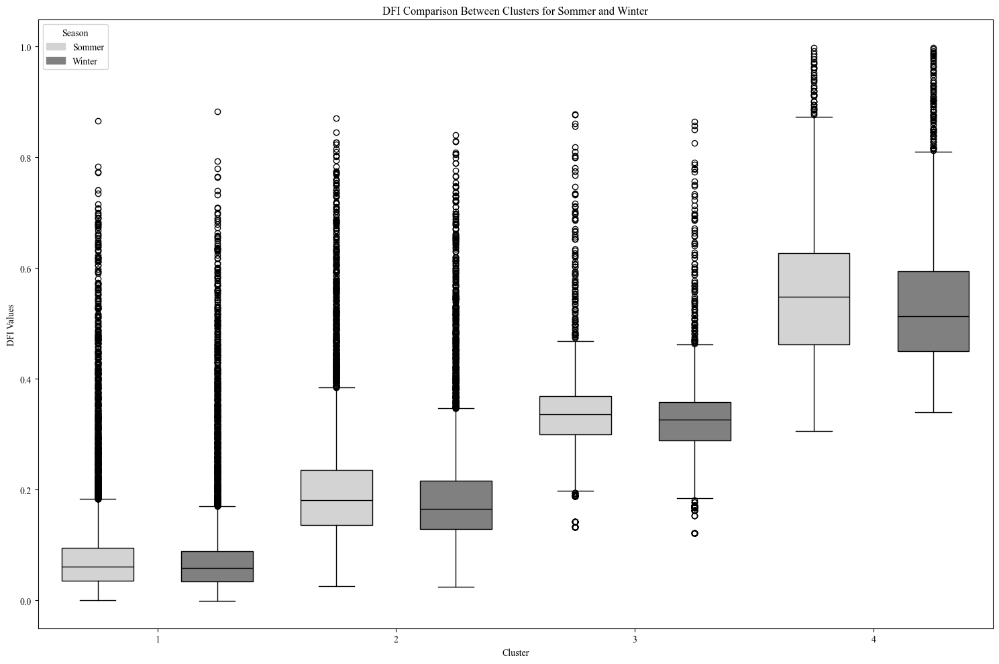

In [82]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel files
dfi_sommer = pd.read_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_sommer_merged.xlsx')
dfi_winter = pd.read_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_winter_merged.xlsx')

# Define the range of columns with numerical values for DFI (columns H to GF)
numerical_columns = dfi_sommer.columns[7:188]

# Melt the dataframes to long format
dfi_sommer_melted = dfi_sommer.melt(id_vars=['cluster'], value_vars=numerical_columns, var_name='Day', value_name='DFI')
dfi_winter_melted = dfi_winter.melt(id_vars=['cluster'], value_vars=numerical_columns, var_name='Day', value_name='DFI')

# Add a season column
dfi_sommer_melted['Season'] = 'Sommer'
dfi_winter_melted['Season'] = 'Winter'

# Combine the dataframes
dfi_combined = pd.concat([dfi_sommer_melted, dfi_winter_melted])

# Create the boxplot
plt.figure(figsize=(15, 10))

# Define colors
colors = {'Sommer': 'lightgrey', 'Winter': 'gray'}

# Create boxplots
for cluster in dfi_combined['cluster'].unique():
    data_to_plot = [dfi_combined[(dfi_combined['cluster'] == cluster) & (dfi_combined['Season'] == season)]['DFI'] 
                    for season in ['Sommer', 'Winter']]
    bp = plt.boxplot(data_to_plot, patch_artist=True, positions=[cluster*2-1, cluster*2],
                widths=0.6)
    for patch, season in zip(bp['boxes'], ['Sommer', 'Winter']):
        patch.set_facecolor(colors[season])
    for median in bp['medians']:
        median.set_color('black')

# Customize plot
plt.title('DFI Comparison Between Clusters for Sommer and Winter')
plt.xlabel('Cluster')
plt.ylabel('DFI Values')
plt.xticks(ticks=[i*2-0.5 for i in range(1, len(dfi_combined['cluster'].unique())+1)], 
           labels=[str(i) for i in range(1, len(dfi_combined['cluster'].unique())+1)])

# Add legend
handles = [plt.Rectangle((0,0),1,1, color=colors[season]) for season in colors]
labels = colors.keys()
plt.legend(handles, labels, title='Season')

plt.tight_layout()
plt.show()



Durchschnittwerte der DFI Sommer/winter

Interpretation PRÜFEN!!!!


Interpretation der saisonalen Variabilität des DFI (Delayed Flow Index) basierend auf der Abbildung
Beobachtungen aus der Abbildung:
Cluster-Vergleich:

Cluster 1 (unten): Zeigt eine geringe saisonale Variabilität, wobei die Winter-DFI-Werte (durchgezogene Linien) geringfügig höher sind als die Sommer-DFI-Werte (gestrichelte Linien). Dies deutet darauf hin, dass in Cluster 1 verzögerte Flüsse im Winter eine etwas größere Rolle spielen, möglicherweise aufgrund von geringfügiger Schneeschmelze oder stabilen Grundwasserbedingungen.
Cluster 2: Zeigt eine deutliche saisonale Variabilität mit im Winter deutlich höheren DFI-Werten als im Sommer. Dies deutet darauf hin, dass dieser Cluster stark von verzögerten Flüssen im Winter beeinflusst wird, wahrscheinlich aufgrund erheblicher Schneeschmelze oder Grundwasseranreicherungen während der Wintermonate.
Cluster 3: Weist eine moderate saisonale Variabilität auf, wobei die Winter-DFI-Werte höher sind als die Sommerwerte, was auf eine bedeutende Rolle von verzögerten Flüssen im Winter hinweist, aber weniger ausgeprägt als in Cluster 2.
Cluster 4 (oben): Zeigt die größte saisonale Variabilität mit deutlich höheren DFI-Werten im Winter als im Sommer. Dies deutet darauf hin, dass in diesem Cluster signifikante Beiträge von verzögerten Flüssen im Winter vorliegen, möglicherweise aufgrund von erheblichen Schneeschmelzeffekten und Grundwasseranreicherungen.
Implikationen der saisonalen Variabilität:

Höherer Winter-DFI: Dies deutet darauf hin, dass die Cluster signifikante Wasserspeichermechanismen (z.B. Schneedecke, Grundwasser) haben, die Wasser langsam über die Zeit abgeben und im Winter mehr zum Flussfluss beitragen.
Niedriger Sommer-DFI: Dies deutet darauf hin, dass im Sommer der Flussfluss stärker von Schnellfluss oder direktem Abfluss abhängig ist, mit geringerer Beteiligung von verzögerten Flüssen aufgrund höherer Verdunstungsraten und geringerer Niederschläge.
Charakteristika der Cluster:

Cluster 1 (unten): Wahrscheinlich charakterisiert durch Regionen mit stabilen hydrologischen Bedingungen und geringfügigen saisonalen Änderungen, was zu einer geringen saisonalen Variabilität führt.
Cluster 2: Möglicherweise dominiert von Gebieten mit erheblicher Schneeschmelze und erhöhtem Grundwasserfluss, was zu einer deutlichen saisonalen Variabilität führt.
Cluster 3: Könnte gemischte Charakteristika haben, mit Beiträgen sowohl von Grundwasser als auch Schneeschmelze, was zu einer moderaten saisonalen Variabilität führt.
Cluster 4 (oben): Könnte Regionen umfassen, die stark von Schneeschmelze und erheblichen Grundwasseranreicherungen während der Wintermonate beeinflusst werden, was zu der größten saisonalen Variabilität führt.
Charakterisierung der Cluster basierend auf DFI:
Hohe saisonale Variabilität (Cluster 2 und 4): Diese Cluster sind wahrscheinlich stark von saisonalen Veränderungen in den Wasseraufnahme- und Freisetzungsmechanismen beeinflusst. Die Schneeschmelze könnte ein Hauptfaktor sein, insbesondere in Cluster 4, während Cluster 2 eine ausgewogenere Mischung aus Grundwasser- und Schneeschmelzbeiträgen haben könnte.
Geringe saisonale Variabilität (Cluster 1 und 3): Diese Cluster haben wahrscheinlich stabilere hydrologische Bedingungen mit konstanten Beiträgen von Grundwasser und weniger ausgeprägter Schneeschmelze, was zu geringeren Unterschieden zwischen Sommer- und Winter-DFI-Werten führt.
Nutzung der DFI-Analyse:
Wassermanagement: Das Verständnis der saisonalen Variabilität des DFI hilft bei der Planung von Wasserressourcenmanagementstrategien, insbesondere in Regionen, die von Schneeschmelze oder Grundwasserspeicherung abhängen.
Ökologische Auswirkungen: Saisonale Veränderungen im Flussfluss beeinflussen aquatische Ökosysteme. Das Wissen über die DFI-Muster hilft bei der Bewertung der ökologischen Gesundheit von Flüssen und Bächen.
Auswirkungen des Klimawandels: Die DFI-Analyse kann helfen vorherzusagen, wie der Klimawandel die saisonale Dynamik der Wasseraufnahme und -freisetzung verändern könnte, was sowohl die Wasserverfügbarkeit als auch die Nachhaltigkeit der Ökosysteme beeinflusst.
Durch die Analyse und das Verständnis dieser Muster können wir fundierte Entscheidungen für ein nachhaltiges Wassermanagement und den ökologischen Schutz dieser Regionen treffen.


Mit schatten

In [16]:
import pandas as pd
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt
import seaborn as sns

# Laden der hochgeladenen Excel-Dateien
df_sommer = pd.read_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_sommer_merged.xlsx')
df_winter = pd.read_excel('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/dfi_winter_merged.xlsx')

# Konvertieren der Spaltennamen in beiden DataFrames in Strings, um sicherzustellen, dass sie übereinstimmen
df_sommer.columns = df_sommer.columns.astype(str)
df_winter.columns = df_winter.columns.astype(str)

# Extrahieren der relevanten Spalten (0-180 Tage) und Cluster-Informationen
columns_to_compare = list(map(str, range(0, 181)))
clusters_sommer = df_sommer['cluster']
clusters_winter = df_winter['cluster']

# Funktion zur Berechnung der Durchschnittswerte und Standardabweichungen pro Cluster für die gemeinsamen numerischen Spalten
def calculate_stats_per_cluster(df, columns, cluster_col):
    mean_values = df.groupby(cluster_col)[columns].mean()
    std_values = df.groupby(cluster_col)[columns].std()
    return mean_values, std_values

# Gemeinsame numerische Spalten zwischen beiden DataFrames finden
common_numeric_columns = [col for col in df_sommer.columns if col.isdigit() and col in df_winter.columns]

# Durchschnittswerte und Standardabweichungen für Sommer und Winter mit den gemeinsamen numerischen Spalten berechnen
mean_sommer, std_sommer = calculate_stats_per_cluster(df_sommer, common_numeric_columns, 'cluster')
mean_winter, std_winter = calculate_stats_per_cluster(df_winter, common_numeric_columns, 'cluster')

# Funktion zur Durchführung eines gepaarten Tests (Wilcoxon) auf den Durchschnittswerten für die gemeinsamen numerischen Spalten
def perform_mean_wilcoxon_test_numeric(cluster):
    sommer_mean = mean_sommer.loc[cluster].values
    winter_mean = mean_winter.loc[cluster].values
    
    stat, p_value = wilcoxon(sommer_mean, winter_mean, zero_method='wilcox')
    return stat, p_value

# Durchführung des gepaarten Tests für jeden Cluster mit gemeinsamen numerischen Spalten
mean_wilcoxon_results_numeric = {}

for cluster in clusters_sommer.unique():
    stat, p_value = perform_mean_wilcoxon_test_numeric(cluster)
    mean_wilcoxon_results_numeric[cluster] = (stat, p_value)

# Umwandlung der Ergebnisse in ein DataFrame zur besseren Visualisierung
mean_wilcoxon_df_numeric = pd.DataFrame.from_dict(mean_wilcoxon_results_numeric, orient='index', columns=['Statistic', 'P-Value']).sort_values(by='P-Value')

# Anzeige des DataFrame
print("Mean Wilcoxon Test Results Between Winter and Summer for Each Cluster (Common Numeric Columns):")
print(mean_wilcoxon_df_numeric)

# Plot der Durchschnittswerte für Sommer und Winter für jeden Cluster mit Standardabweichung
plt.figure(figsize=(14, 10))

# Erstellen einer Farbpalette für die Clusterfarben aus der Seaborn colorblind Palette
colorblind_palette = sns.color_palette("colorblind")
selected_colors = [colorblind_palette[i] for i in [0, 1, 2, 3]]  # Blau, Orange, Grün, Rot

for idx, cluster in enumerate(mean_sommer.index):
    # Sommer
    plt.plot(mean_sommer.columns, mean_sommer.loc[cluster], label=f'Summer Cluster {cluster}', linestyle='--', linewidth=2, color=selected_colors[idx])
    plt.fill_between(mean_sommer.columns, 
                     mean_sommer.loc[cluster] - std_sommer.loc[cluster], 
                     mean_sommer.loc[cluster] + std_sommer.loc[cluster], 
                     color=selected_colors[idx], alpha=0.1)
    # Begrenzungslinien für Sommer
    plt.plot(mean_sommer.columns, mean_sommer.loc[cluster] - std_sommer.loc[cluster], linestyle='--', color=selected_colors[idx], alpha=0.3)
    plt.plot(mean_sommer.columns, mean_sommer.loc[cluster] + std_sommer.loc[cluster], linestyle='--', color=selected_colors[idx], alpha=0.3)

    # Winter
    plt.plot(mean_winter.columns, mean_winter.loc[cluster], label=f'Winter Cluster {cluster}', linestyle='-',linewidth=2, color=selected_colors[idx])
    plt.fill_between(mean_winter.columns, 
                     mean_winter.loc[cluster] - std_winter.loc[cluster], 
                     mean_winter.loc[cluster] + std_winter.loc[cluster], 
                     color=selected_colors[idx], alpha=0.1)
    # Begrenzungslinien für Winter
    plt.plot(mean_winter.columns, mean_winter.loc[cluster] - std_winter.loc[cluster], linestyle='-', color=selected_colors[idx], alpha=0.3)
    plt.plot(mean_winter.columns, mean_winter.loc[cluster] + std_winter.loc[cluster], linestyle='-', color=selected_colors[idx], alpha=0.3)

# X-Achse anpassen
plt.xticks([0, 5, 15, 30, 60, 90, 180], labels=['0', '5', '15', '30', '60', '90', '180'])

plt.xlabel('Day')
plt.ylabel('Mean DFI')
plt.title('')

# Vertikale Rasterlinien in hellgrau
plt.grid(True, which='major', axis='x', color='lightgrey', linestyle='-', linewidth=0.5)  

plt.legend()
plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/seasonality/6.4_dfi_winter_sommer.svg', format='svg')

plt.show()


Mean Wilcoxon Test Results Between Winter and Summer for Each Cluster (Common Numeric Columns):
   Statistic       P-Value
3        0.0  2.733651e-31
4        0.0  2.734840e-31
1        0.0  2.734887e-31
2        0.0  2.734887e-31


##### Saisonalität der Cluster 
??????

Diese Abbildung zeigt die Durchschnittswerte des Delayed Flow Index (DFI) für Sommer und Winter über die Zeit (0 bis 180 Tage) für vier verschiedene Cluster. Die folgenden Punkte können aus der Abbildung hervorgehoben werden:

Unterschiede zwischen Sommer und Winter:

Für jeden Cluster sind die durchschnittlichen DFI-Werte im Sommer höher als im Winter. Dies ist durch die Position der gestrichelten Linien (Sommer) über den durchgezogenen Linien (Winter) ersichtlich.
Der Unterschied zwischen Sommer- und Winterwerten scheint für alle Cluster signifikant zu sein.
Trend über die Zeit:

Die DFI-Werte nehmen im Laufe der Zeit sowohl im Sommer als auch im Winter ab, was darauf hindeutet, dass der Delayed Flow Index über den Zeitraum von 180 Tagen generell sinkt.
Variabilität innerhalb der Cluster:

Die schattierten Bereiche um die Linien repräsentieren die Standardabweichung der DFI-Werte. Diese zeigen die Variabilität innerhalb der Cluster.
Cluster 4 hat die größte Variabilität, gefolgt von Cluster 3, Cluster 2 und schließlich Cluster 1. Dies deutet darauf hin, dass die Messstellen in Cluster 4 eine größere Streuung der DFI-Werte aufweisen.
Cluster-Spezifische Unterschiede:

Cluster 1 zeigt generell die niedrigsten DFI-Werte sowohl im Sommer als auch im Winter.
Cluster 4 zeigt die höchsten DFI-Werte, was darauf hinweist, dass die Messstellen in Cluster 4 generell höhere Delayed Flow Indizes haben.
Saisonale Schwankungen:

Der Unterschied zwischen den Sommer- und Winterwerten ist für Cluster 4 am ausgeprägtesten, was auf stärkere saisonale Schwankungen in diesem Cluster hinweist.
Cluster 1 weist die geringsten Unterschiede zwischen den Jahreszeiten auf, was auf weniger ausgeprägte saisonale Schwankungen hinweist.
Zusammengefasst zeigt diese Abbildung, dass es signifikante Unterschiede im DFI zwischen Sommer und Winter gibt, dass die DFI-Werte im Laufe der Zeit abnehmen und dass es erhebliche Unterschiede in der Variabilität und in den saisonalen Schwankungen zwischen den Clustern gibt.



##### Was sagt das über die Saisonalität der Einzugsgebiete innerhalb der Cluster aus?

Welche Charakteristika haben solche einzugsgebiete?



####  significance of the differences between summer and winter within each cluster


# Seasonality Decades 

#### CDCs Winter und Sommer je Cluster geplottet

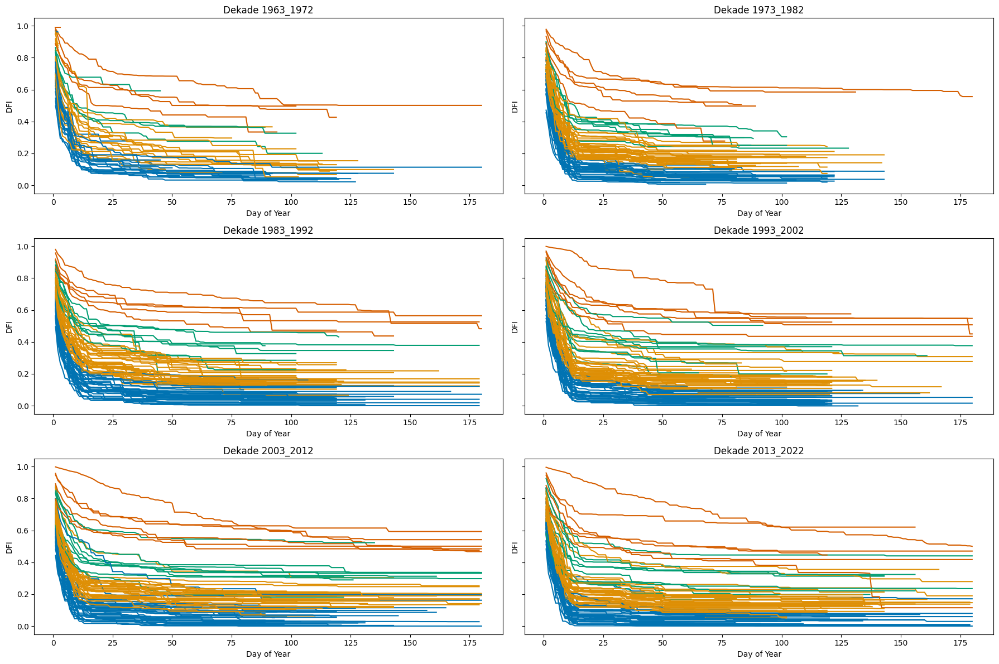

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Hauptdaten laden
file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_transposed_dekaden_sommer.xlsx'
df = pd.read_excel(file_path)

# Cluster-Daten laden
cluster_file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/merged_hierarchie_overview_updated.xlsx'
cluster_df = pd.read_excel(cluster_file_path)

# Verbinde die Hauptdaten mit den Cluster-Daten anhand der Messstelleninformationen
df = pd.merge(df, cluster_df[['messstelle', 'cluster']], on='messstelle', how='left')

# Dekadenliste
dekaden = [
    "1963_1972", "1973_1982", "1983_1992", "1993_2002", "2003_2012", "2013_2022"
]

# Clusterfarben festlegen: Blau, Orange, Grün, Rot
colorblind_palette = sns.color_palette("colorblind")
selected_colors = [colorblind_palette[i] for i in [0, 1, 2, 3]]
cluster_colors = {1: selected_colors[0], 2: selected_colors[1], 3: selected_colors[2], 4: selected_colors[3]}

# Subplots erstellen
fig, axs = plt.subplots(3, 2, figsize=(18, 12), sharey=True)

# Plots für jede Dekade
for i, dekade in enumerate(dekaden):
    ax = axs[i//2, i%2]
    dekade_df = df[df['dekade'] == dekade]
    
    for _, row in dekade_df.iterrows():
        messstelle = row['messstelle']
        cluster = row['cluster']
        if pd.notna(cluster):  # Überprüfen, ob der Cluster-Wert vorhanden ist
            data = row.drop(labels=['dekade', 'messstelle', 'cluster']).dropna()
            ax.plot(data.index, data.values, label=messstelle, color=cluster_colors[int(cluster)])
    
    ax.set_title(f'Dekade {dekade}')
    ax.set_xlabel('Day of Year')
    ax.set_ylabel('DFI')

plt.tight_layout()
plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_dekaden_plots_colorblind.png')
plt.show()



Winter

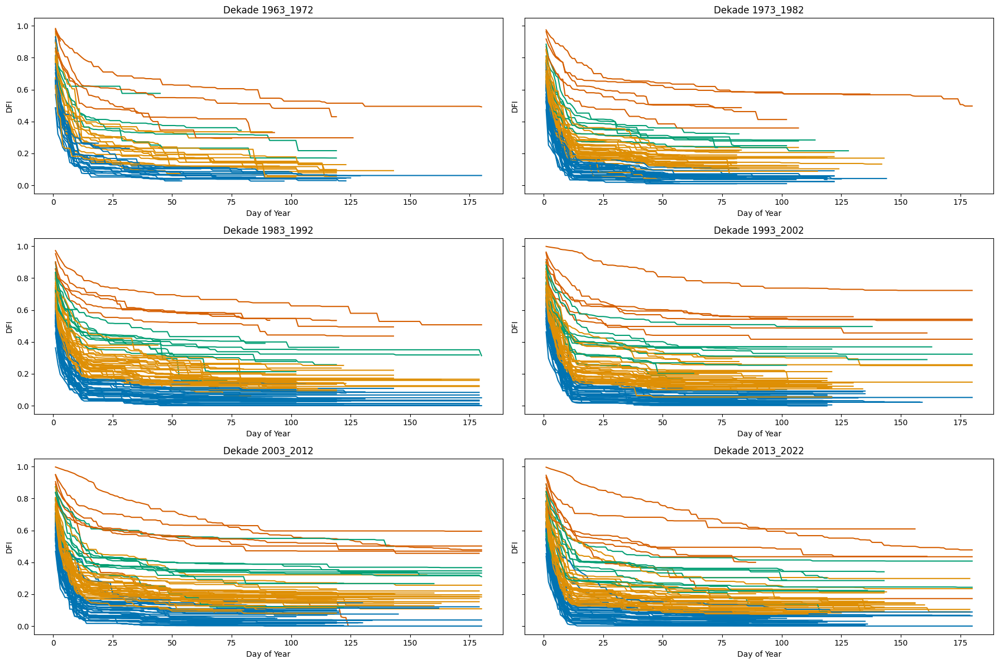

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Hauptdaten laden
file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_transposed_dekaden_winter.xlsx'
df = pd.read_excel(file_path)

# Cluster-Daten laden
cluster_file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/3_arbeitsordner/merged_hierarchie_overview_updated.xlsx'
cluster_df = pd.read_excel(cluster_file_path)

# Verbinde die Hauptdaten mit den Cluster-Daten anhand der Messstelleninformationen
df = pd.merge(df, cluster_df[['messstelle', 'cluster']], on='messstelle', how='left')

# Dekadenliste
dekaden = [
    "1963_1972", "1973_1982", "1983_1992", "1993_2002", "2003_2012", "2013_2022"
]

# Clusterfarben festlegen: Blau, Orange, Grün, Rot
colorblind_palette = sns.color_palette("colorblind")
selected_colors = [colorblind_palette[i] for i in [0, 1, 2, 3]]
cluster_colors = {1: selected_colors[0], 2: selected_colors[1], 3: selected_colors[2], 4: selected_colors[3]}

# Subplots erstellen
fig, axs = plt.subplots(3, 2, figsize=(18, 12), sharey=True)

# Plots für jede Dekade
for i, dekade in enumerate(dekaden):
    ax = axs[i//2, i%2]
    dekade_df = df[df['dekade'] == dekade]
    
    for _, row in dekade_df.iterrows():
        messstelle = row['messstelle']
        cluster = row['cluster']
        if pd.notna(cluster):  # Überprüfen, ob der Cluster-Wert vorhanden ist
            data = row.drop(labels=['dekade', 'messstelle', 'cluster']).dropna()
            ax.plot(data.index, data.values, label=messstelle, color=cluster_colors[int(cluster)])
    
    ax.set_title(f'Dekade {dekade}')
    ax.set_xlabel('Day of Year')
    ax.set_ylabel('DFI')

plt.tight_layout()
plt.savefig('C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_dekaden_plots_colorblind_winter.png')
plt.show()


### Welche EZG soll ich überhaupt miteinander vergleichen?
--> Ab 1963

Plot gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade.png
Tabelle gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade.xlsx


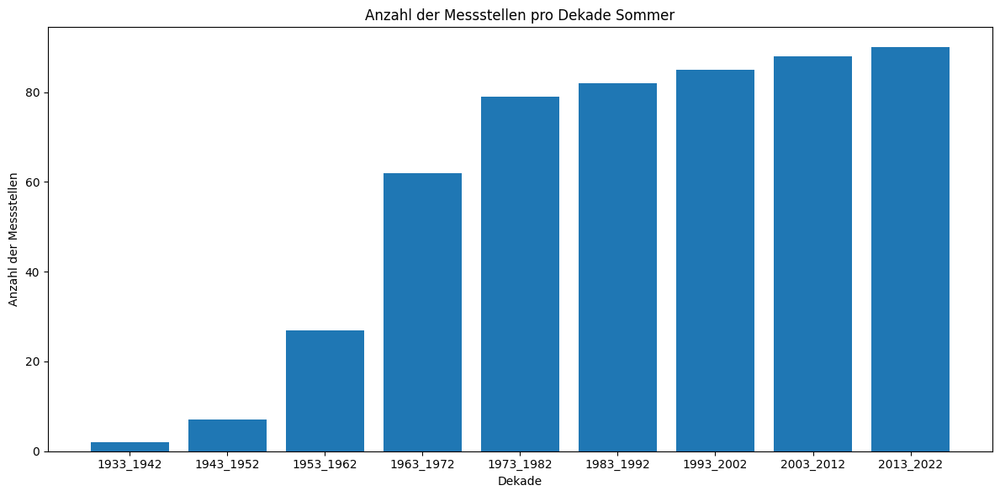

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Datei laden
file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_transposed_dekaden_sommer.xlsx'
df = pd.read_excel(file_path)

# Berechne die Anzahl der Messstellen pro Dekade
messstellen_pro_dekade = df.groupby('dekade')['messstelle'].nunique().reset_index()
messstellen_pro_dekade.columns = ['Dekade', 'Anzahl der Messstellen']

# Plot erstellen
plt.figure(figsize=(12, 6))
plt.bar(messstellen_pro_dekade['Dekade'], messstellen_pro_dekade['Anzahl der Messstellen'])
plt.xlabel('Dekade')
plt.ylabel('Anzahl der Messstellen')
plt.title('Anzahl der Messstellen pro Dekade Sommer')
plt.grid(False)
plt.tight_layout()

# Speichern des Plots
plot_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade.png'
plt.savefig(plot_path)

# Tabelle anzeigen
output_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade.xlsx'
messstellen_pro_dekade.to_excel(output_path, index=False)

print(f"Plot gespeichert unter: {plot_path}")
print(f"Tabelle gespeichert unter: {output_path}")

plt.show()


Plot gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade_winter.png
Tabelle gespeichert unter: C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade_winter.xlsx


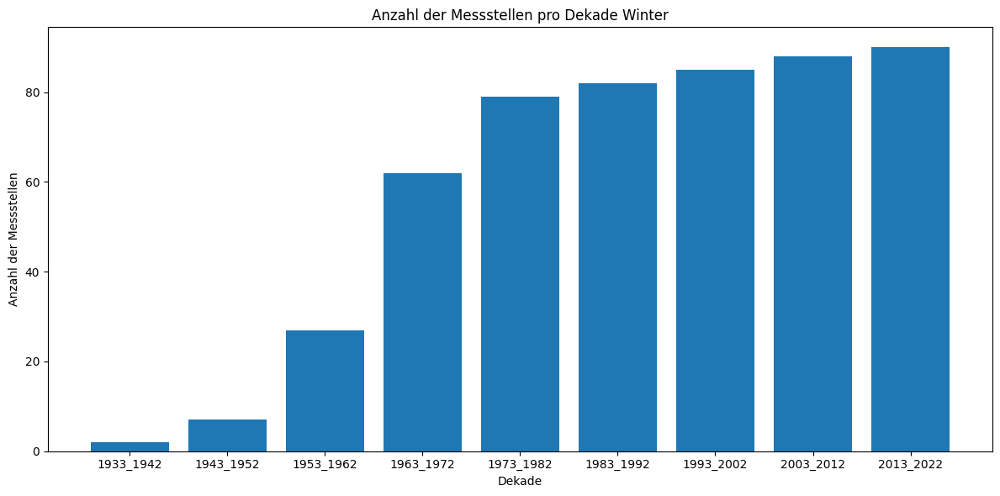

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Datei laden
file_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/dfi_transposed_dekaden_winter.xlsx'
df = pd.read_excel(file_path)

# Berechne die Anzahl der Messstellen pro Dekade
messstellen_pro_dekade = df.groupby('dekade')['messstelle'].nunique().reset_index()
messstellen_pro_dekade.columns = ['Dekade', 'Anzahl der Messstellen']

# Plot erstellen
plt.figure(figsize=(12, 6))
plt.bar(messstellen_pro_dekade['Dekade'], messstellen_pro_dekade['Anzahl der Messstellen'])
plt.xlabel('Dekade')
plt.ylabel('Anzahl der Messstellen')
plt.title('Anzahl der Messstellen pro Dekade Winter')
plt.grid(False)
plt.tight_layout()

# Speichern des Plots
plot_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade_winter.png'
plt.savefig(plot_path)

# Tabelle anzeigen
output_path = 'C:/Users/Lenovo/Documents/Masterarbeit/Masterarbeit/1_daten/2_dfi/dfi_seasonality/messstellen_pro_dekade_winter.xlsx'
messstellen_pro_dekade.to_excel(output_path, index=False)

print(f"Plot gespeichert unter: {plot_path}")
print(f"Tabelle gespeichert unter: {output_path}")

plt.show()
